In [ ]:
import os
import cv2
import numpy as np
import imutils
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/CNN/roots'
print("Исходный путь к рабочей директории: ", os.getcwd())
os.chdir(path)
print("Новый путь к рабочей директории: ", os.getcwd())
from google.colab.patches import cv2_imshow

Mounted at /content/drive
Исходный путь к рабочей директории:  /content
Новый путь к рабочей директории:  /content/drive/MyDrive/CNN/roots


In [ ]:
#отрисовка контуров на первичном сыром изображении
def image_contour(image):
    raw = image.copy()

  # Применение фильтр медианного размытия
    blurred_image = cv2.medianBlur(image, 5)

  # Создание фильтр уточнения границ
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

  # Применение фильтра к изображению
    sharp_image = cv2.filter2D(blurred_image, -1, kernel)

  # Преобразование изображение в градации серого
    gray = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2GRAY)

  # Создание экземпляр фильтра CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

  # Применение фильтр CLAHE к градациям серого изображения
    contrast_enhanced = clahe.apply(gray)

    _, thresh = cv2.threshold(contrast_enhanced, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


  # Поиск контуров на бинаризованном изображении

  #contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours, _ = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

    return(contours, raw, gray)

#отрисовка контура чашки на изображении, чтобы потом по нему создать маску
def image_petri_cnt(raw, cnts_petri):

    raw_new = cv2.drawContours(raw, [cnts_petri], -1, (0, 255, 0), 2)
  #cv2_imshow(raw_new)
  # создаём маску по контуру чашки петри
    mask = np.zeros(gray.shape,np.uint8)
    mask = cv2.drawContours(mask, [cnts_petri], -1, 255, cv2.FILLED)
    fg_masked = cv2.bitwise_and(raw_new, raw_new, mask=mask)

  # белый фон (используем инвертированную маску)
    mask = cv2.bitwise_not(mask)
    bk = np.full(raw_new.shape, 255, dtype=np.uint8)
    bk_masked = cv2.bitwise_and(bk, bk, mask=mask)

  # сливаем фон и передний план
    final = cv2.bitwise_or(fg_masked, bk_masked)
    return(final)

#обрезает изображение по контуру чашки петри,после чего можно отрисовывать
#контуры внутри чашки(потенциально полезные)
def image_petri_cnt_cutter(final, path_cutted_petri):
  #код для разложения и обрезки изображения по маске контура круга чашки петри
    gray = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
    thresh = cv2.threshold(gray, 195, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.bitwise_not(thresh)
    cnts_in_petri = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts_in_petri = imutils.grab_contours(cnts_in_petri)
    cnts_in_petri = sorted(cnts_in_petri, key=cv2.contourArea, reverse=True)[:10]

  #обработка каждого контура
    i = 0
    for c in cnts_in_petri:
        if cv2.contourArea(c) > 1000:

      #рисование маски, оставляем контур
            mask = np.zeros(gray.shape, np.uint8)
            mask = cv2.drawContours(mask, [c], -1, 255, cv2.FILLED)

      #белый фон
            fg_masked = cv2.bitwise_and(raw, raw, mask=mask)
            mask = cv2.bitwise_not(mask)
            bk = np.full(raw.shape, 255, dtype=np.uint8)
            bk_masked = cv2.bitwise_and(bk, bk, mask=mask)
            finalcont = cv2.bitwise_or(fg_masked, bk_masked)

      #ограничивающая область по контуру
            output = finalcont.copy()
            x,y,w,h = cv2.boundingRect(c)

      #вырезание области с чашкой
            roi = finalcont[y:y+h, x:x+w]

      #команда для изменения размера изображения если оно будет подаваться в нейросеть
      #roi = cv2.resize(roi, (400,400))

      #сохраняем картинку
            cv2.imwrite(path_cutted_petri, roi)
      #cv2_imshow(roi)
            i += 1
            return(roi)

#удаляет контуры в заданном диапазоне, так как при первичной отрисовке контуров
#создается много шумов, мелких точечных контуров и слишком больших
def contur_cleaner(min_contur_area, max_contur_area, contours):

  #список для id контуров, которые будут удаляться
    d = []

  #отбор контуров по фильтрам для удаления
    for i, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if area <= min_contur_area or area >= max_contur_area:
            d.append(i)

  #удаление контуров из списка контуров
        cleaned_contours = np.delete(contours, d)


        return(cleaned_contours)

#принимает на вход массив контуров numpy и изображение для отрисовки
#возвращает изображение с отрисованными контурами
def contur_drawer(conturs, img):

  # Создание копии изображения для рисования контуров на нем
    contour_image = img.copy()
  #отрисовка изображения чашки с очищенными контурами
    for contour in conturs:
    # Рисование контура на изображении
    contour_image = cv2.drawContours(contour_image, [contour], -1, (0, 255, 0), 4)


  #cv2_imshow(contour_image)
  return(contour_image)

#функция отрисовки контуров методом adaptive threshold
def image_contour_adaptive(image):

  # Загрузка изображения
    raw = image.copy()

  # Примените фильтр медианного размытия
    blurred_image = cv2.medianBlur(image, 5)

  # Создайте фильтр уточнения границ
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

  # Примените фильтр к изображению
    sharp_image = cv2.filter2D(blurred_image, -1, kernel)

  # Преобразуйте изображение в градации серого
    gray = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2GRAY)

  # Создайте экземпляр фильтра CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

  # Примените фильтр CLAHE к градациям серого изображения
    contrast_enhanced = clahe.apply(gray)

  #gray = cv2.GaussianBlur(gray, (5, 5), 0)
  # Применение бинаризации для выделения корней
  #edges = cv2.Canny(gray, 50, 150)
    thresh = cv2.adaptiveThreshold(contrast_enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                 cv2.THRESH_BINARY_INV, 221, 5)
  #_, thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


  #Поиск контуров на бинаризованном изображении

  #contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours, _ = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

    return(contours, raw, gray)


#функция вычисления коэффициента конверсии размера в пикселях в размеры в см
def convert_pixels_to_cm(contour, dish_height_mm):
    #нахождение высоты контура в пикселях
    contour_height_px = cv2.boundingRect(contour)[3]

    #Вычисление коэффициента конвертации пикселей в миллиметры
    conversion_factor_mm = np.divide(contour_height_px, dish_height_mm)
    conversion_factor_cm = np.divide(conversion_factor_mm, 10)
    return conversion_factor_cm

#по массиву контуров вычисляет площадь контуров в пикселях, в см2, а также массу
#для работы необходимо ввести коэффициент конверсии площади в пиксели и
#коэффициент конверсии площади см2 в граммы
def calculator(contours, conversion_factor_pixels, conversion_factor_mass):

    total_area_pixels = 0
    for contour in contours:
    # Вычисляем площадь каждого контура в пикселях
        area = cv2.contourArea(contour)

    #суммарная площадь в пикселях
        total_area_pixels = np.add(area, total_area_pixels)

    area_cm2 = np.multiply(total_area_pixels, conversion_factor_pixels)

    mass_grams = np.multiply(area_cm2, conversion_factor_mass)

    return(total_area_pixels, area_cm2, mass_grams)

In [45]:
path_raw = "/content/drive/MyDrive/CNN/roots/AAA_0473.JPG"

# Загрузка изображения
image = cv2.imread(path_raw)

#получение контуров сырого исходного изображения
contours, raw, gray = image_contour(image)

#отрисовка контуров на изображении
contour_image = contur_drawer(contours, raw)

#метод отрисовки изображений который поддерживается google colab
#cv2_imshow(contour_image)
#запись изображения на диск
path_write_cnt_img = "/content/drive/MyDrive/CNN/roots/img/cut_petri_ready.jpg"
cv2.imwrite(path_write_cnt_img, contour_image)

#отрисовка контура чашки
#сортировка списка контуров от самого большего к меньшему, чтобы достать
#второй по величине контур(первый самый большой контур это рамка фото)
#вторым по величине контуром является внешний контур чашки петри(если чашка вся помещена внутри фото)
cnts_petri = sorted(contours, key=cv2.contourArea, reverse=True)[1]

final = image_petri_cnt(raw, cnts_petri)

path_cutted_petri = "/content/drive/MyDrive/CNN/roots/cut_petri.jpg"
roi = image_petri_cnt_cutter(final, path_cutted_petri)

#контуры меньше будут удаляться
min_contur_area = 500

#контуры больше будут удаляться
max_contur_area = 5000000

#отрисовка контуров растений обрезанного изображения чашки cv2.threshold
contours_roi, raw_roi, gray_roi = image_contour(roi)
max_dish_contur_roi = sorted(contours_roi,key=cv2.contourArea, reverse=True)[0]
cleaned_contours_roi = contur_cleaner(min_contur_area, max_contur_area, contours_roi)
contour_image_roi = contur_drawer(cleaned_contours_roi, raw_roi)

#отрисовка контуров растений обрезанного изображения чашки adaptive threshold
contours_roi_a, raw_roi_a, gray_roi_a = image_contour_adaptive(roi)

#отбор контура окружности чашки в качестве референса для функции конверсии
#высоты контура в пикселях в см
max_dish_contur_roi_a= sorted(contours_roi_a,key=cv2.contourArea, reverse=True)[0]
cleaned_contours_roi_a = contur_cleaner(min_contur_area, max_contur_area, contours_roi_a)
contour_image_roi_a = contur_drawer(cleaned_contours_roi_a, raw_roi_a)

#высота чашки петри
dish_height_mm = 85
coef_pix_cm = convert_pixels_to_cm(max_dish_contur_roi, dish_height_mm)
coef_pix_cm_a = convert_pixels_to_cm(max_dish_contur_roi_a, dish_height_mm)
print(coef_pix_cm, coef_pix_cm_a)

#коэффициент необходимо вычислить по результатам эксперимента
conversion_factor_mass = 1e-7
total_area_pixels, area_cm2, mass_grams = calculator(cleaned_contours_roi,
                                                     coef_pix_cm, conversion_factor_mass)
print(total_area_pixels, area_cm2, mass_grams)

total_area_pixels_a, area_cm2_a, mass_grams_a = calculator(cleaned_contours_roi_a,
                                                     coef_pix_cm_a, conversion_factor_mass)
print(total_area_pixels_a, area_cm2_a, mass_grams_a)

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5071: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


2.501176470588235 3.1858823529411766
4371037.0 10932734.896470588 1.0932734896470586
3125453.0 9957325.557647059 0.9957325557647059


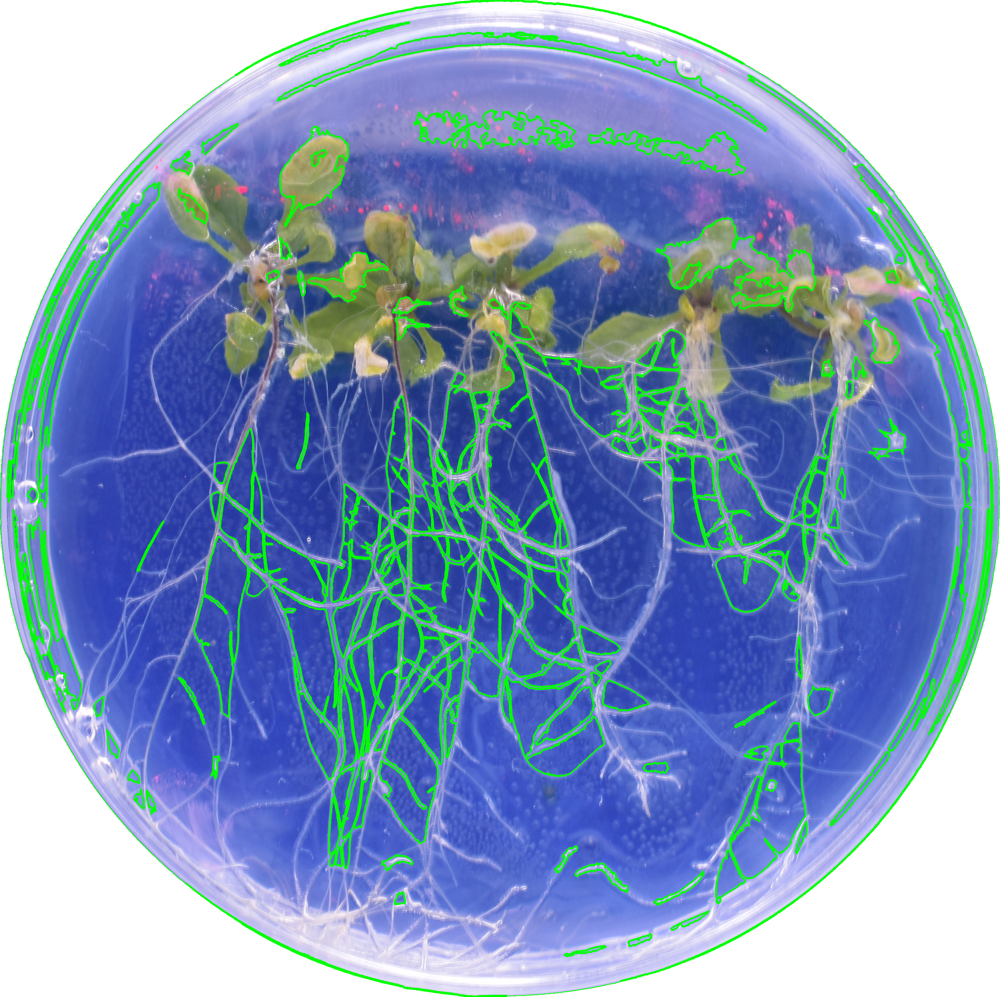

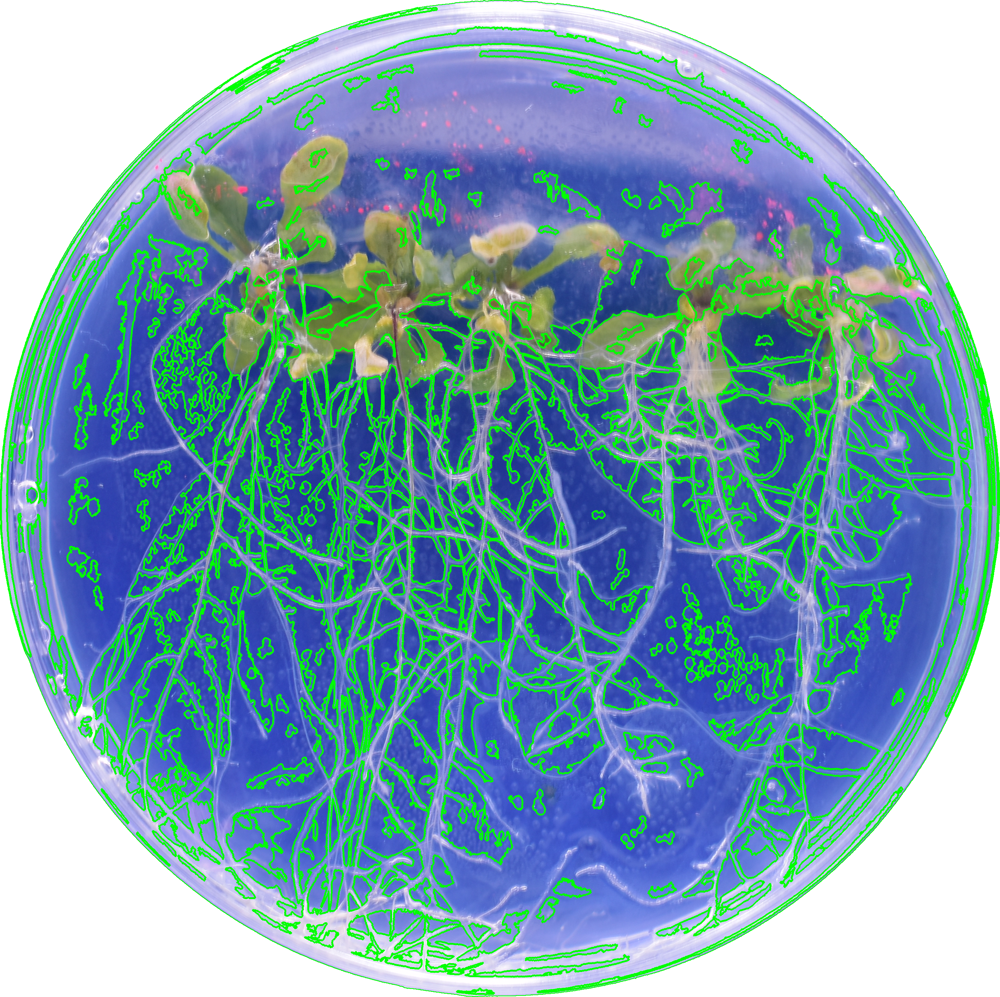

In [ ]:
cv2_imshow(contour_image_roi)
cv2_imshow(contour_image_roi_a)